# Fome Zero

## Tópicos
-  Geral
-  Pais
-  Cidade
-  Restaurantes
-  Tipos de Culinária



# Limpeza

In [1]:
# Importar bibliotecas e dataset

import numpy as np
import pandas as pd
import inflection
import plotly.express as px
import folium
from streamlit_folium import folium_static
from folium.plugins import MarkerCluster
import plotly.io as pio
pio.templates.default = "plotly_white"
df = pd.read_csv("dataset/zomato.csv")
pd.options.display.max_columns = None

2026-01-26 14:41:40.658 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.


In [2]:
df.shape #7527 linhas no total

(7527, 21)

In [3]:
#Visualização inicial dos dados

df.info()

#Limpeza:
#1 Provavelmente colunas como "locality verbose" não serão interessantes para análise. Coluna "Switch to order menu" só tem valores 0, excluir coluna
#2 Padronizar o nome das colunas para minusculo e retirar os espaços
#3 Verificar e limpar, ou preencher, valores nulos
#4 Eliminar as linhas cujo "average_cost_for_two" for "0"
#5 Remover outlier da australia de preço 135.000.000

#Feature Engenier
# Criar uma coluna de classificação para cada range de preço "barato", "normal", "gourmet", "caro"
# Criar uma coluna de pouco recomendado até muito recomendado baseado na mediana da quantidade de votos
# modificar a coluna: "Contry Code" , substituindo o código postal pelo nome do país
# classificar as cores baseado no rating color
# criar um preço médio para dois em real, convertendo todas as moedas

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7527 entries, 0 to 7526
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         7527 non-null   int64  
 1   Restaurant Name       7527 non-null   object 
 2   Country Code          7527 non-null   int64  
 3   City                  7527 non-null   object 
 4   Address               7527 non-null   object 
 5   Locality              7527 non-null   object 
 6   Locality Verbose      7527 non-null   object 
 7   Longitude             7527 non-null   float64
 8   Latitude              7527 non-null   float64
 9   Cuisines              7512 non-null   object 
 10  Average Cost for two  7527 non-null   int64  
 11  Currency              7527 non-null   object 
 12  Has Table booking     7527 non-null   int64  
 13  Has Online delivery   7527 non-null   int64  
 14  Is delivering now     7527 non-null   int64  
 15  Switch to order menu 

In [4]:
#1. Criar uma cópia do dataframe e tirar as colunas que não serão usadas

df1 = df.copy()
df1 = df1.drop(["Locality Verbose","Switch to order menu"],axis = 1)
df1.columns = df1.columns.str.lower().str.strip().str.replace(' ', '_')
df1

,restaurant_id,restaurant_name,country_code,city,address,locality,longitude,latitude,cuisines,average_cost_for_two,currency,has_table_booking,has_online_delivery,is_delivering_now,price_range,aggregate_rating,rating_color,rating_text,votes
0,6310675,Mama Lou's Italian Kitchen,162,Las Piñas City,"Block 1, Lot 36, Tropical Avenue Corner Tropic...",BF International,121.009787,14.447615,Italian,1100,Botswana Pula(P),1,0,0,3,4.6,3F7E00,Excellent,619
1,6310675,Mama Lou's Italian Kitchen,162,Las Piñas City,"Block 1, Lot 36, Tropical Avenue Corner Tropic...",BF International,121.009787,14.447615,Italian,1100,Botswana Pula(P),1,0,0,3,4.6,3F7E00,Excellent,619
2,6314542,Blackbird,162,Makati City,"Nielson Tower, Ayala Triangle Gardens, Salcedo...","Ayala Triangle Gardens, Salcedo Village, Makat...",121.024562,14.556042,"European, Asian",3100,Botswana Pula(P),0,0,0,4,4.7,3F7E00,Excellent,469
3,6301293,Banapple,162,Makati City,"Ayala Triangle Gardens, Salcedo Village, Makat...","Ayala Triangle Gardens, Salcedo Village, Makat...",121.023171,14.556196,"Filipino, American, Italian, Bakery",800,Botswana Pula(P),0,0,0,3,4.4,5BA829,Very Good,867
4,6315689,Bad Bird,162,Makati City,"Hole In The Wall, Floor 4, Century City Mall, ...","Century City Mall, Poblacion, Makati City",121.027708,14.565899,American,700,Botswana Pula(P),0,0,0,3,4.4,5BA829,Very Good,858
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7522,5912546,Eataly,208,İstanbul,"Zorlu Center AVM, Köprü Katı, Levazım Mahalles...","Zorlu Center AVM, Levazım, Beşiktaş",29.017326,41.065322,"Italian, Pizza, Fresh Fish",300,Turkish Lira(TL),0,0,0,4,4.3,5BA829,Very Good,1367
7523,5913006,Tarihi Çınaraltı Aile Çay Bahçesi,208,İstanbul,"Çengelköy Mahallesi, Çınaraltı Camii Sokak, No...",Çengelköy Merkez,29.052620,41.050280,"Fast Food, Izgara, Seafood, Tea, Coffee",45,Turkish Lira(TL),0,0,0,2,4.5,3F7E00,Excellent,1172
7524,5923535,Boon Cafe & Restaurant,208,İstanbul,"Çengelköy Mahallesi, Çengelköy Caddesi, Kara S...",Çengelköy Merkez,29.052623,41.050717,Restaurant Cafe,140,Turkish Lira(TL),0,0,0,4,4.2,5BA829,Very Good,1160
7525,5914190,Kanaat Lokantası,208,İstanbul,"Sultantepe Mahallesi, Selmani Pak Caddesi, No ...",Üsküdar Merkez,29.016590,41.025741,"Home-made, Izgara",95,Turkish Lira(TL),0,0,0,3,4.0,5BA829,Very Good,770


In [5]:
#deletar duplicatas


df1.drop_duplicates(inplace = True)


In [6]:
#3 Verificar valores nulois e se serão preenchidos ou deletados

df1.isnull().sum() #15 valores nulos em cusines
df1[df1["cuisines"].isnull()] # o tipo de cozinha não foi especificado, mas não invalida os outros dados. Preencher com "Not Informed"
df1["cuisines"]= df1["cuisines"].fillna("Not Informed")


In [7]:
#4 procurar valores NaN escritos, ao invés de np.nan
valores_nulos = [ 'NaN', 'nan', 'None', 'none', 'NA', 'n/a', 'N/A', '', ' ']
df1.replace(valores_nulos, np.nan, inplace=True)
df1.isnull().sum()
#tudo ok

restaurant_id           0
restaurant_name         0
country_code            0
city                    0
address                 0
locality                0
longitude               0
latitude                0
cuisines                0
average_cost_for_two    0
currency                0
has_table_booking       0
has_online_delivery     0
is_delivering_now       0
price_range             0
aggregate_rating        0
rating_color            0
rating_text             0
votes                   0
dtype: int64

In [8]:
# Eliminar as linhas cujo "average_cost_for_two" for "0"
df1 = df1.loc[df1["average_cost_for_two"] != 0, :]


# Feature Engenier
1. Criar uma coluna de classificação para cada range de preço "barato", "normal", "gourmet", "caro"
2. Criar uma coluna de pouco recomendado até muito recomendado baseado na mediana da quantidade de votos
3. criar a coluna: "Contry name" , substituindo o código postal pelo nome do país
4. classificar as cores baseado no rating color
5. criar um preço médio para dois em real, convertendo todas as moedas

In [9]:
df1.head()

,restaurant_id,restaurant_name,country_code,city,address,locality,longitude,latitude,cuisines,average_cost_for_two,currency,has_table_booking,has_online_delivery,is_delivering_now,price_range,aggregate_rating,rating_color,rating_text,votes
0,6310675,Mama Lou's Italian Kitchen,162,Las Piñas City,"Block 1, Lot 36, Tropical Avenue Corner Tropic...",BF International,121.009787,14.447615,Italian,1100,Botswana Pula(P),1,0,0,3,4.6,3F7E00,Excellent,619
2,6314542,Blackbird,162,Makati City,"Nielson Tower, Ayala Triangle Gardens, Salcedo...","Ayala Triangle Gardens, Salcedo Village, Makat...",121.024562,14.556042,"European, Asian",3100,Botswana Pula(P),0,0,0,4,4.7,3F7E00,Excellent,469
3,6301293,Banapple,162,Makati City,"Ayala Triangle Gardens, Salcedo Village, Makat...","Ayala Triangle Gardens, Salcedo Village, Makat...",121.023171,14.556196,"Filipino, American, Italian, Bakery",800,Botswana Pula(P),0,0,0,3,4.4,5BA829,Very Good,867
4,6315689,Bad Bird,162,Makati City,"Hole In The Wall, Floor 4, Century City Mall, ...","Century City Mall, Poblacion, Makati City",121.027708,14.565899,American,700,Botswana Pula(P),0,0,0,3,4.4,5BA829,Very Good,858
5,6304833,Manam,162,Makati City,"Level 1, Greenbelt 2, Ayala Center, Greenbelt,...","Greenbelt 2, San Lorenzo, Makati City",121.020380,14.552351,Filipino,700,Botswana Pula(P),0,0,0,3,4.7,3F7E00,Excellent,930


In [10]:
# Criar a coluna: "Contry name" , substituindo o código postal pelo nome do país
countries = {
    1: "India",
    14: "Australia",
    30: "Brazil",
    37: "Canada",
    94: "Indonesia",
    148: "New Zealand",
    162: "Philippines",
    166: "Qatar",
    184: "Singapore",
    189: "South Africa",
    191: "Sri Lanka",
    208: "Turkey",
    214: "United Arab Emirates",
    215: "United Kingdom",
    216: "United States of America"
}

df1["country_name"] = df1["country_code"].map(countries).copy()

C:\Users\Luann\AppData\Local\Temp\ipykernel_16564\1430555998.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1["country_name"] = df1["country_code"].map(countries).copy()


In [11]:
# classificar as cores baseado no rating colo

colors = {
    "3F7E00": "darkgreen",
    "5BA829": "green",
    "9ACD32": "lightgreen",
    "CDD614": "orange",
    "FFBA00": "red",
    "CBCBC8": "darkred",
    "FF7800": "darkred",
}

df1["color"] = df1["rating_color"].map(colors).copy()


C:\Users\Luann\AppData\Local\Temp\ipykernel_16564\1973447427.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1["color"] = df1["rating_color"].map(colors).copy()


In [12]:
#Criar uma coluna de classificação para cada range de preço "barato", "normal", "gourmet", "caro"

classificacao = {
    1 : "cheap",
    2 : "normal",
    3 : "gourmet",
    4 : "caro"
}

df1["price_type"] = df1["price_range"].map(classificacao).copy()

C:\Users\Luann\AppData\Local\Temp\ipykernel_16564\398152025.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1["price_type"] = df1["price_range"].map(classificacao).copy()


In [13]:
df1.head()

,restaurant_id,restaurant_name,country_code,city,address,locality,longitude,latitude,cuisines,average_cost_for_two,currency,has_table_booking,has_online_delivery,is_delivering_now,price_range,aggregate_rating,rating_color,rating_text,votes,country_name,color,price_type
0,6310675,Mama Lou's Italian Kitchen,162,Las Piñas City,"Block 1, Lot 36, Tropical Avenue Corner Tropic...",BF International,121.009787,14.447615,Italian,1100,Botswana Pula(P),1,0,0,3,4.6,3F7E00,Excellent,619,Philippines,darkgreen,gourmet
2,6314542,Blackbird,162,Makati City,"Nielson Tower, Ayala Triangle Gardens, Salcedo...","Ayala Triangle Gardens, Salcedo Village, Makat...",121.024562,14.556042,"European, Asian",3100,Botswana Pula(P),0,0,0,4,4.7,3F7E00,Excellent,469,Philippines,darkgreen,caro
3,6301293,Banapple,162,Makati City,"Ayala Triangle Gardens, Salcedo Village, Makat...","Ayala Triangle Gardens, Salcedo Village, Makat...",121.023171,14.556196,"Filipino, American, Italian, Bakery",800,Botswana Pula(P),0,0,0,3,4.4,5BA829,Very Good,867,Philippines,green,gourmet
4,6315689,Bad Bird,162,Makati City,"Hole In The Wall, Floor 4, Century City Mall, ...","Century City Mall, Poblacion, Makati City",121.027708,14.565899,American,700,Botswana Pula(P),0,0,0,3,4.4,5BA829,Very Good,858,Philippines,green,gourmet
5,6304833,Manam,162,Makati City,"Level 1, Greenbelt 2, Ayala Center, Greenbelt,...","Greenbelt 2, San Lorenzo, Makati City",121.020380,14.552351,Filipino,700,Botswana Pula(P),0,0,0,3,4.7,3F7E00,Excellent,930,Philippines,darkgreen,gourmet


In [14]:
 df1["votes"].quantile(0.25)

np.float64(152.0)

In [15]:
# Criar uma coluna de pouco recomendado até muito recomendado baseado na mediana da quantidade de votos:
#"pouco recomendado", "recomendado", "muito recomendado"

#1 criar uma função que irá receber um valor da coluna "votes"
#2 aplicar o if para comparar o valor da linha com o valor do 1° quartil, mediana e 3° quartil e classificar de acordo
quantile_25 = df1["votes"].quantile(0.25)
quantile_75 = df1["votes"].quantile(0.75)
mediana = df1["votes"].median()

def recomendacao (linha):
    vote = linha["votes"]
    rating = linha["aggregate_rating"]

    if rating > 4 and vote > quantile_75:
        return "muito recomendado"
    elif (rating >=4) or (rating >= 3 and vote >= mediana):
        return "recomendado"
    elif rating < 3:
        return "pouco recomendado"
    else:
        return "Neutro"
        
df1["recomendation"] = df1.apply(recomendacao, axis=1).copy()

df1["recomendation"].value_counts(dropna =False)
        

C:\Users\Luann\AppData\Local\Temp\ipykernel_16564\1200161150.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1["recomendation"] = df1.apply(recomendacao, axis=1).copy()


recomendation
recomendado          4307
muito recomendado    1428
Neutro                988
pouco recomendado     167
Name: count, dtype: int64

In [16]:
# criar um preço médio para dois em real, convertendo todas as moedas

# criar uma função para ler as linhas das colunas currency e average cost
# criar uma variavel de conversoes de moeda para converter para real
# a função deverar ler os valores, identificar a moeda na coluna currency e multiplicar o valor da coluna average cost pela sua conversão

df1.currency.unique()

conversoes = {
    'Botswana Pula(P)': 0.41,
    'Brazilian Real(R$)': 1.0,
    'Dollar($)': 5.44,
    'Emirati Diram(AED)': 1.48,
    'Indian Rupees(Rs.)': 0.065,
    'Indonesian Rupiah(IDR)': 0.00034,
    'NewZealand($)': 3.14,
    'Pounds(£)': 7.25,
    'Qatari Rial(QR)': 1.49,
    'Rand(R)': 0.32,
    'Sri Lankan Rupee(LKR)': 0.018,
    'Turkish Lira(TL)': 0.13
}

def conversao (linha):
    moedas = linha["currency"]
    valor = linha["average_cost_for_two"]
    
    if moedas in conversoes:
        return valor*conversoes[moedas]
    else:
        None
df1["average_cost_for_two_real"] = df1.apply(conversao,axis = 1).copy()



C:\Users\Luann\AppData\Local\Temp\ipykernel_16564\2799341703.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1["average_cost_for_two_real"] = df1.apply(conversao,axis = 1).copy()


In [17]:
## Criar um mapa dos restaurantes

## 1° criar uma variável para as médias de longitude e latitude
## 2° criar o mapa base usando o df1.map  e passando a lat_media, longmedia e zoom_start
## 3° criar um agrupardor de pinos : marker_cluster = MarkerCluster().addto(mapa)
## fazer um loop for para criar os marcadores
## for index, location_info in itterrows():
## adicionar os códigos html para cara coluna do location_info
## marcadores = folium.map.Marker [ Location : [location_info["latitude"],location_info["longitude"]], popup = hyml, icon = n sei]



def create_map (df):
    latitude_media = df["latitude"].mean()
    longitude_media = df["longitude"].mean()
    mapa = folium.Map(
        [latitude_media,longitude_media],
        zoom_start = 2)

    marker_cluster = MarkerCluster().add_to(mapa)


    for index, location_info in df.iterrows():
        
        html =f"""
        <div style="width: 250px;">
            <h3 style="text-align: center;"><b>{location_info['restaurant_name']}</b></h3>
            
            <div style="font-family: sans-serif; font-size: 12px; margin-top: 10px;">
                <b>Cozinha:</b> {location_info['cuisines']}<br>
                <b>Preço (2 pessoas):</b> R$ {location_info['average_cost_for_two_real']:.2f}<br>
                <b>Nota:</b> {location_info['aggregate_rating']}/5.0 <br>
                <b>Votos:</b> {location_info['votes']}<br>
                <b>Recomendação:</b> {location_info['recomendation']}
            </div>
        </div>
    """
        marcador = folium.Marker(
            location = [location_info["latitude"],location_info["longitude"]],
            popup = folium.Popup(html, max_width = 300),
            icon = folium.Icon(location_info["color"], icon = "home", prefix = "fa")).add_to(marker_cluster)
    return mapa

mapa = create_map(df1)

mapa

In [18]:
#Remover o outlier da Australia

outlier = df1.loc[df1["country_name"] == "Australia", "average_cost_for_two_real"].idxmax()
df1 = df1.drop(outlier)

## Geral
1. Quantos restaurantes únicos estão registrados?
2. Quantos países únicos estão registrados?
3. Quantas cidades únicas estão registradas?
4. Qual o total de avaliações feitas?
5. Qual o total de tipos de culinária registrados?


In [19]:
#1 Quantos restaurantes únicos estão registrados?

df1.restaurant_id.nunique()

6889

In [20]:
#2 Quantos países únicos estão registrados?

df1.country_name.nunique()

15

In [21]:
#3 Quantas cidades únicas estão registradas?
df1.city.nunique()

125

In [22]:
#4 Qual o total de avaliações feitas?
df1["votes"].sum()

np.int64(4189405)

In [23]:
#5 Qual o total de tipos de culinária registrados?

df_culinaria = df1.copy()
df_culinaria["cuisines"] = df_culinaria["cuisines"].str.strip().str.casefold()
df_culinaria["cuisines"] = pd.DataFrame(df1["cuisines"].str.split(",").copy())
df_culinaria = df_culinaria.explode("cuisines")
df_culinaria.head()

df_culinaria["cuisines"].nunique()

343

# Pais

1. Qual o nome do país que possui mais cidades registradas?
2. Qual o nome do país que possui mais restaurantes registrados?
3. Qual o nome do país que possui mais restaurantes com o nível de preço igual a 4
registrados?
4. Qual o nome do país que possui a maior quantidade de tipos de culinária
distitos?
6. Qual o nome do país que possui a maior quantidade de avaliações feitas?
7. Qual o nome do país que possui a maior quantidade de restaurantes que fazem
entrega?
8. Qual o nome do país que possui a maior quantidade de restaurantes que aceitam
reservas?
9. Qual o nome do país que possui, na média, a maior quantidade de avaliações
registrada?
10. Qual o nome do país que possui, na média, a maior nota média registrada?
11. Qual o nome do país que possui, na média, a menor nota média registrada?
12. Qual a média de preço de um prato para dois por país?

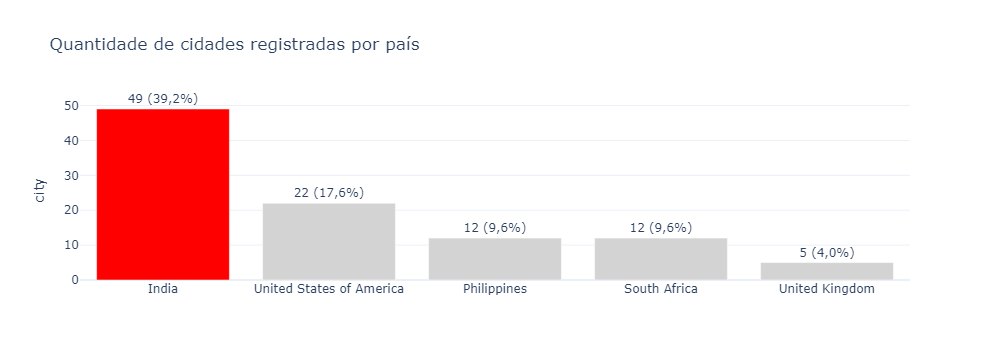

In [24]:
#1 Qual o nome do país que possui mais cidades registradas?

# Objetivo - Agrupar os paises por quantidade unica de cidade

cidades_por_pais = df1.groupby("country_name")["city"].nunique().sort_values(ascending = False).reset_index()
vencedor = cidades_por_pais.iloc[0]["country_name"]

cidades_por_pais["destaque"] = cidades_por_pais["country_name"].apply(lambda x: "vencedor" if x == vencedor else "outros")

total_cidades = cidades_por_pais["city"].sum()
cidades_por_pais["percentual"] = (cidades_por_pais["city"] / total_cidades * 100)


fig = px.bar(
    cidades_por_pais.head(5),
    title = "Quantidade de cidades registradas por país",
    x = "country_name",
    y = "city",
    color = "destaque",
    color_discrete_map = {"vencedor" : "red", "outros" : "lightgray"}, 
    text = "city",
    custom_data = ["percentual"]
)

fig.update_layout(showlegend=False, xaxis_title=None, yaxis_title="city",separators=",." )
fig.update_traces(texttemplate="%{y:,.0f} (%{customdata[0]:.1f}%)",textposition="outside",cliponaxis=False)
fig.show()


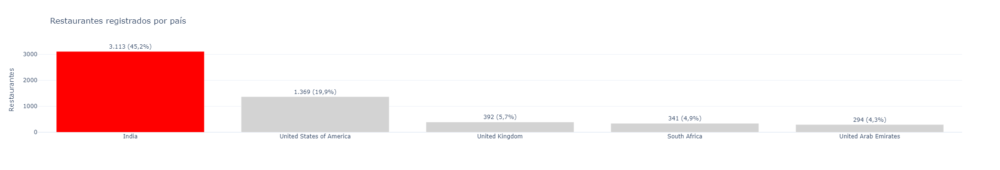

In [25]:
#2 Qual o nome do país que possui mais restaurantes registrados?

# Objetivo - Agrupar os paises por quantidade unica de restaurantes

restaurantes_por_pais = df1.groupby("country_name")["restaurant_id"].count().sort_values(ascending = False).reset_index()
pais_restaurante_vencedor = restaurantes_por_pais.iloc[0]["country_name"]
restaurantes_por_pais["destaque"] = restaurantes_por_pais["country_name"].apply(lambda x: "vencedor" if x == pais_restaurante_vencedor else "outros")

total_restaurante_por_pais = restaurantes_por_pais["restaurant_id"].sum()
restaurantes_por_pais["percentual"] = (restaurantes_por_pais["restaurant_id"] / total_restaurante_por_pais * 100)


fig = px.bar(
    restaurantes_por_pais.head(5),
    title = "Restaurantes registrados por país",
    x = "country_name",
    y = "restaurant_id",
    color = "destaque",
    color_discrete_map = {"vencedor" : "red", "outros" : "lightgray"}, 
    text = "restaurant_id",
    custom_data = ["percentual"]
)


fig.update_layout(showlegend=False, xaxis_title=None, yaxis_title="Restaurantes",separators=",." )
fig.update_traces(texttemplate="%{y:,.0f} (%{customdata[0]:.1f}%)",textposition="outside",cliponaxis=False)
fig.show()





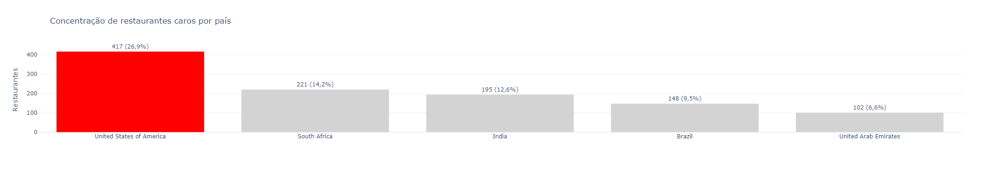

In [26]:
#3 Qual o nome do país que possui mais restaurantes com o nível de preço igual a 4 registrados?

# - Agrupar os restaurantes unicos cujo prince_range é igual a 4 por país

restaurante_preco = df1[df1["price_range"] == 4]
restaurantes_preco_4 = restaurante_preco.groupby("country_name")["restaurant_id"].nunique().sort_values(ascending = False).reset_index()
vencedor_preco_4 = restaurantes_preco_4.iloc[0]["country_name"]

restaurantes_preco_4["destaque"] = restaurantes_preco_4["country_name"].apply(lambda x: "vencedor" if x == vencedor_preco_4 else "outros")

total_preco = restaurantes_preco_4["restaurant_id"].sum()
restaurantes_preco_4["percentual"] = (restaurantes_preco_4["restaurant_id"] / total_preco * 100)


fig = px.bar(
    restaurantes_preco_4.head(5),
    title = "Concentração de restaurantes caros por país",
    x = "country_name",
    y = "restaurant_id",
    color = "destaque",
    color_discrete_map = {"vencedor" : "red", "outros" : "lightgray"}, 
    text = "restaurant_id",
    custom_data = ["percentual"]
)


fig.update_layout(
    separators=",.",
    showlegend=False,
    xaxis_title=None,
    yaxis_title="Restaurantes"
)

fig.update_traces(
    texttemplate="%{y:,.0f} (%{customdata[0]:.1f}%)",
    textposition="outside",
    cliponaxis=False
)

fig.show()


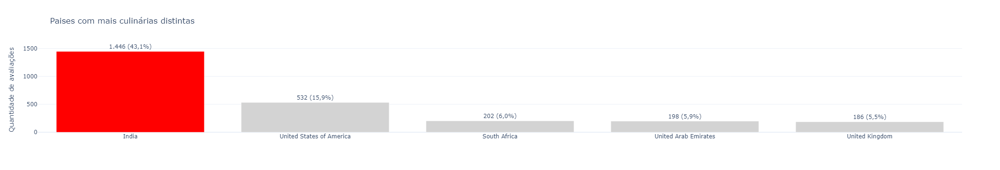

In [27]:
#4 Qual o nome do país que possui a maior quantidade de tipos de culinária distintos?

# - Agrupar os paises pelo numero unico de culinarias

culinaria_por_pais = df1.groupby("country_name")["cuisines"].nunique().sort_values(ascending = False).reset_index()
culinaria_vencedor = culinaria_por_pais.iloc[0]["country_name"]
culinaria_por_pais["destaque"] = culinaria_por_pais["country_name"].apply( lambda x : "vencedor" if x == culinaria_vencedor else "outros")


total_culinarias = culinaria_por_pais["cuisines"].sum()
culinaria_por_pais["percentual"] = (culinaria_por_pais["cuisines"]/total_culinarias * 100)

fig = px.bar(
    culinaria_por_pais.head(5),
    title = "Paises com mais culinárias distintas",
    x = "country_name",
    y = "cuisines",
    color = "destaque",
    color_discrete_map = {"vencedor" : "red", "outros" : "lightgray"},
    text = "cuisines",
    custom_data = ["percentual"]
)

fig.update_layout(
    separators=",.",
    showlegend=False,
    xaxis_title=None,
    yaxis_title="Quantidade de avaliações"
)

fig.update_traces(
    texttemplate="%{y:,.0f} (%{customdata[0]:.1f}%)",
    textposition="outside",
    cliponaxis=False
)

fig.show()
                                                                       


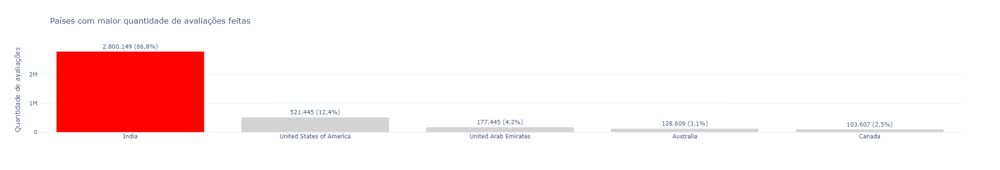

In [28]:
#5 Qual o nome do país que possui a maior quantidade de avaliações feitas?

# - Agrupar os paises pela soma da quantiade de avaliações (votes)

paises_por_avaliacao = df1.groupby("country_name")["votes"].sum().sort_values(ascending = False).reset_index()
vencedor_avaliacoes = paises_por_avaliacao.iloc[0]["country_name"]
paises_por_avaliacao["destaque"] = paises_por_avaliacao["country_name"].apply(lambda x: "vencedor" if x == vencedor_avaliacoes else "outros")

total_votos = paises_por_avaliacao["votes"].sum()
paises_por_avaliacao["percentual"] = (paises_por_avaliacao["votes"] / total_votos * 100)


fig = px.bar(
    paises_por_avaliacao.head(5),
    title="Países com maior quantidade de avaliações feitas",
    x="country_name",
    y="votes",
    color="destaque",
    color_discrete_map={"vencedor": "red", "outros": "lightgray"},
    custom_data=["percentual"]
)


fig.update_traces(
    texttemplate="%{y:,.0f} (%{customdata[0]:.1f}%)",
    textposition="outside",
    cliponaxis=False
)

fig.update_layout(
    separators=",.",
    showlegend=False,
    xaxis_title=None,
    yaxis_title="Quantidade de avaliações"
)

fig.show()


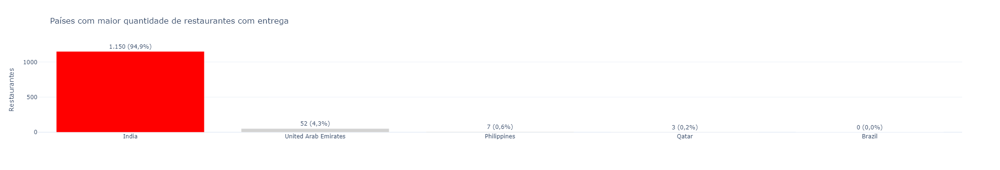

In [29]:
# 6 Qual o nome do país que possui a maior quantidade de restaurantes que fazem entrega?

# - Agrupar os paises pela soma da quantidade de restaurantes que fazem entrega

paises_por_entregas = df1.groupby("country_name")["is_delivering_now"].sum().sort_values(ascending = False).reset_index()
vencedor_entregas = paises_por_entregas.iloc[0]["country_name"]
paises_por_entregas["destaque"] = paises_por_entregas["country_name"].apply(lambda x : "vencedor" if x == vencedor_entregas else "outros")

total_entregas = paises_por_entregas["is_delivering_now"].sum()
paises_por_entregas["percentual"] = (paises_por_entregas["is_delivering_now"] / total_entregas * 100)

fig = px.bar(
    paises_por_entregas.head(5),
    title="Países com maior quantidade de restaurantes com entrega",
    x="country_name",
    y="is_delivering_now",
    color="destaque",
    color_discrete_map={"vencedor": "red", "outros": "lightgray"},
    custom_data=["percentual"]
)


fig.update_traces(
    texttemplate="%{y:,.0f} (%{customdata[0]:.1f}%)",
    textposition="outside",
    cliponaxis=False
)

fig.update_layout(
    separators=",.",
    showlegend=False,
    xaxis_title=None,
    yaxis_title="Restaurantes"
)

fig.show()

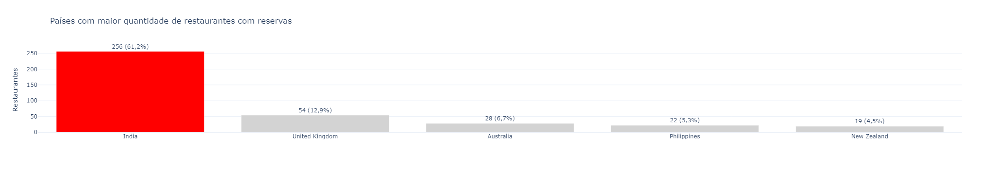

In [30]:
#7 Qual o nome do país que possui a maior quantidade de restaurantes que aceitam reservas?

# - agrupar os paises pela soma da quantidade de restaurantes que aceitam reserva (has_table_booking)
paises_por_reserva = df1.groupby("country_name")["has_table_booking"].sum().sort_values(ascending = False).reset_index()
vencedor_reserva = paises_por_reserva.iloc[0]["country_name"]
paises_por_reserva["destaque"] = paises_por_reserva["country_name"].apply(lambda x : "vencedor" if x == vencedor_reserva else "outros")

total_reservas = paises_por_reserva["has_table_booking"].sum()
paises_por_reserva["percentual"] = (paises_por_reserva["has_table_booking"] / total_reservas * 100)

fig = px.bar(
    paises_por_reserva.head(5),
    title="Países com maior quantidade de restaurantes com reservas",
    x="country_name",
    y="has_table_booking",
    color="destaque",
    color_discrete_map={"vencedor": "red", "outros": "lightgray"},
    custom_data=["percentual"]
)


fig.update_traces(
    texttemplate="%{y:,.0f} (%{customdata[0]:.1f}%)",
    textposition="outside",
    cliponaxis=False
)

fig.update_layout(
    separators=",.",
    showlegend=False,
    xaxis_title=None,
    yaxis_title="Restaurantes"
)

fig.show()

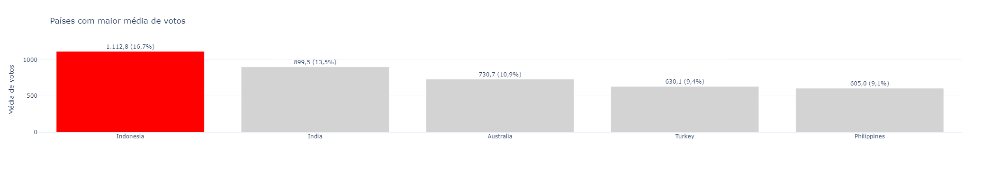

In [31]:
#8 Qual o nome do país que possui, na média, a maior quantidade de avaliações registrada?

# - Agrupar os paises pela média de avaliações registradas (votes)

paises_por_media = (
    df1.groupby("country_name")["votes"]
    .mean()
    .sort_values(ascending=False)
    .reset_index()
)

vencedor_media = paises_por_media.iloc[0]["country_name"]
paises_por_media["destaque"] = paises_por_media["country_name"].apply(
    lambda x: "vencedor" if x == vencedor_media else "outros"
)

total_media = paises_por_media["votes"].sum()
paises_por_media["percentual"] = (
    paises_por_media["votes"] / total_media * 100
)

fig = px.bar(
    paises_por_media.head(5),
    title="Países com maior média de votos",
    x="country_name",
    y="votes",
    color="destaque",
    color_discrete_map={"vencedor": "red", "outros": "lightgray"},
    custom_data=["percentual"]
)

fig.update_traces(
    texttemplate="%{y:,.1f} (%{customdata[0]:.1f}%)",
    textposition="outside",
    cliponaxis=False
)

fig.update_layout(
    separators=",.",
    showlegend=False,
    xaxis_title=None,
    yaxis_title="Média de votos"
)

fig.show()




In [32]:
#9 Qual o nome do país que possui, na média, a maior nota média registrada

# - Agrupar os paises pela média de avaliações registradas (aggregate_rating)

paises_por_nota = df1.groupby("country_name")["aggregate_rating"].mean().sort_values(ascending = False).reset_index()
paises_por_nota["aggregate_rating"] = paises_por_nota["aggregate_rating"].map('{:,.2f}'.format)
paises_por_nota.head(5)


,country_name,aggregate_rating
0,Indonesia,4.60
1,Philippines,4.46
2,Singapore,4.44
3,United States of America,4.40
4,Australia,4.37


In [33]:
#10 Qual o nome do país que possui, na média, a menor nota média registrada?

# - Agrupar os paises pela média de avaliações registradas (aggregate_rating)

paises_por_nota_2 = df1.groupby("country_name")["aggregate_rating"].mean().sort_values(ascending = True).reset_index()
paises_por_nota_2["aggregate_rating"] = paises_por_nota_2["aggregate_rating"].map('{:,.2f}'.format)
paises_por_nota_2.head(5)

,country_name,aggregate_rating
0,Brazil,3.37
1,India,4.04
2,United Arab Emirates,4.04
3,Sri Lanka,4.06
4,South Africa,4.06


In [34]:
# 11 Qual a média de preço de um prato para dois por país?

# - Agrupar os paises pela média dos valores de prato para dois (average_cost_for_two_real), que ja está padronizada

paises_por_prato = df1.groupby("country_name")["average_cost_for_two_real"].mean().sort_values(ascending = False).reset_index()
paises_por_prato["average_cost_for_two_real"] = paises_por_prato["average_cost_for_two_real"].map('{:,.2f}'.format)
paises_por_prato.head(5)

,country_name,average_cost_for_two_real
0,Singapore,769.42
1,Philippines,503.41
2,Australia,393.91
3,United Kingdom,321.89
4,United States of America,301.27


# Cidade
1. Qual o nome da cidade que possui mais restaurantes registrados?
2. Qual o nome da cidade que possui mais restaurantes com nota média acima de
4?
3. Qual o nome da cidade que possui mais restaurantes com nota média abaixo de
2.5?
4. Qual o nome da cidade que possui o maior valor médio de um prato para dois?
5. Qual o nome da cidade que possui a maior quantidade de tipos de culinária
distintas?
6. Qual o nome da cidade que possui a maior quantidade de restaurantes que fazem
reservas?
7. Qual o nome da cidade que possui a maior quantidade de restaurantes que fazem
entregas?
8. Qual o nome da cidade que possui a maior quantidade de restaurantes que
aceitam pedidos online?

In [77]:
# 1 Qual o nome da cidade que possui mais restaurantes registrados?


restaurantes_por_cidade = df1.groupby(["city","country_name"])["restaurant_id"].count().reset_index()
restaurantes_por_cidade = restaurantes_por_cidade.sort_values("restaurant_id", ascending=False)

restaurantes_por_cidade.head(10)

,city,country_name,restaurant_id
0,Abu Dhabi,United Arab Emirates,80
2,Agra,India,80
4,Allahabad,India,80
6,Ankara,Turkey,80
5,Amritsar,India,80
11,Bangalore,India,80
12,Bhopal,India,80
10,Austin,United States of America,80
9,Aurangabad,India,80
23,Chennai,India,80


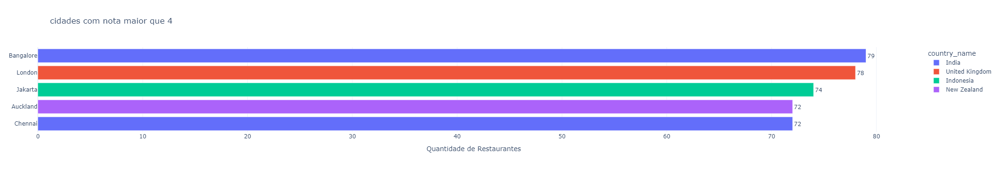

In [71]:
# 2 Qual o nome da cidade que possui mais restaurantes com nota média acima de 4?

# - Objetivo: Agrupar as cidades pela média das notas que forem acima de 4
nota_acima = df1[df1["aggregate_rating"] >4]

cidade_nota_alta = nota_acima.groupby(["country_name", "city"])["aggregate_rating"].count().sort_values(ascending=False).reset_index()

fig = px.bar(
    cidade_nota_alta.head(),
    x = "aggregate_rating",
    y = "city",
    color = "country_name",
    title = "cidades com nota maior que 4",
    text = "aggregate_rating"
)
fig.update_layout(
    yaxis={'categoryorder':'total ascending'},
    separators=",.",
    xaxis_title="Quantidade de Restaurantes",
    yaxis_title=None,
    showlegend=True 
)

fig.update_traces(
    texttemplate='%{text:,.0f}', 
    textposition='outside'
)

fig.show()

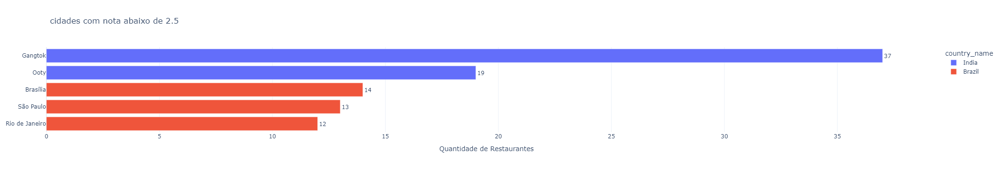

In [37]:
# Qual o nome da cidade que possui mais restaurantes com nota média abaixo de 2.5?

# - Objetivo: Agrupar as cidades pela média das notas que forem abaixo de 2.5


nota_abaixo = df1[df1["aggregate_rating"] < 2.5]

cidade_nota_baixa = nota_abaixo.groupby(["country_name", "city"])["aggregate_rating"].count().sort_values(ascending=False).reset_index()

fig = px.bar(
    cidade_nota_baixa.head(),
    x = "aggregate_rating",
    y = "city",
    color = "country_name",
    title = "cidades com nota abaixo de 2.5",
    text = "aggregate_rating"
)
fig.update_layout(
    yaxis={'categoryorder':'total ascending'},
    separators=",.",
    xaxis_title="Quantidade de Restaurantes",
    yaxis_title=None,
    showlegend=True 
)

fig.update_traces(
    texttemplate='%{text:,.0f}', 
    textposition='outside'
)

fig.show()


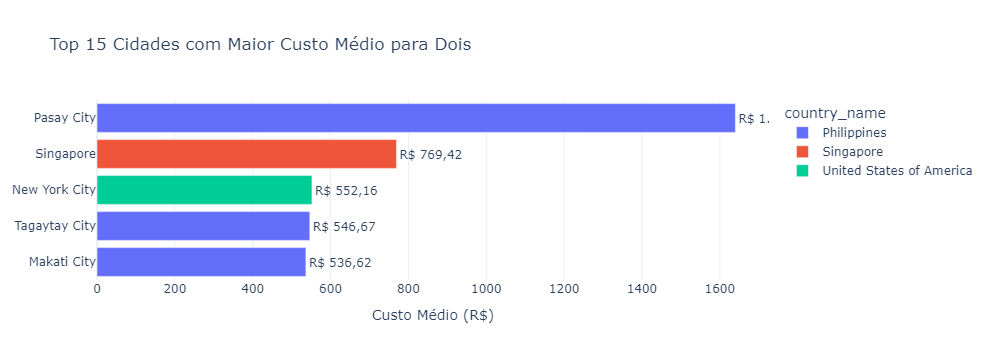

In [38]:
# Qual o nome da cidade que possui o maior valor médio de um prato para dois?

cidade_maior_valor_final = df1.groupby(["city","country_name"])["average_cost_for_two_real"].mean().sort_values(ascending = False).reset_index()

fig = px.bar(
    cidade_maior_valor_final.head(),
    x="average_cost_for_two_real",
    y="city",
    color="country_name",
    text="average_cost_for_two_real",
    title="Top 15 Cidades com Maior Custo Médio para Dois",
    orientation='h'       
)


fig.update_layout(
    yaxis={'categoryorder':'total ascending'},
    separators=",.",
    xaxis_title="Custo Médio (R$)",
    yaxis_title=None,
    showlegend=True 
)

fig.update_traces(
    texttemplate='R$ %{text:,.2f}', 
    textposition='outside'
)

fig.show()

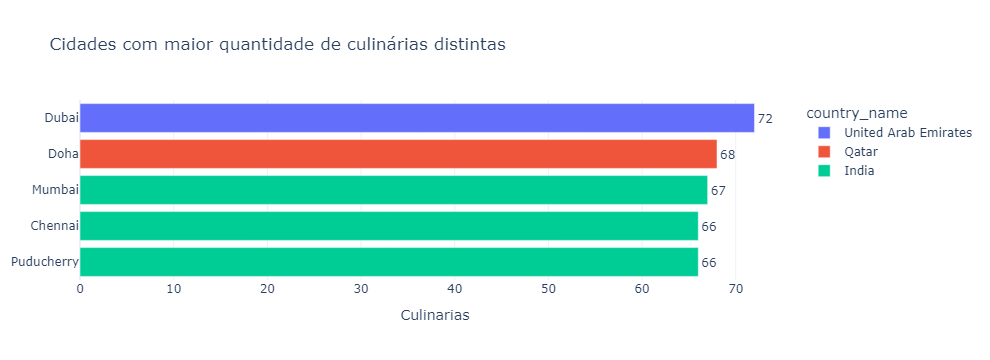

In [39]:
# Qual o nome da cidade que possui a maior quantidade de tipos de culinária distintas?

cidade_culinaria_unica = df_culinaria.groupby(["city","country_name"])["cuisines"].nunique().sort_values(ascending = False).reset_index()

fig = px.bar(
    cidade_culinaria_unica.head(),
    x = "cuisines",
    y = "city",
    color = "country_name",
    title = "Cidades com maior quantidade de culinárias distintas",
    text = "cuisines",
    orientation = "h"
)

fig.update_layout(
    yaxis={'categoryorder':'total ascending'},
    separators=",.",
    xaxis_title="Culinarias",
    yaxis_title=None,
    showlegend=True 
)

fig.update_traces(
    texttemplate="%{text:,.0f}", 
    textposition="outside"
)

fig.show()

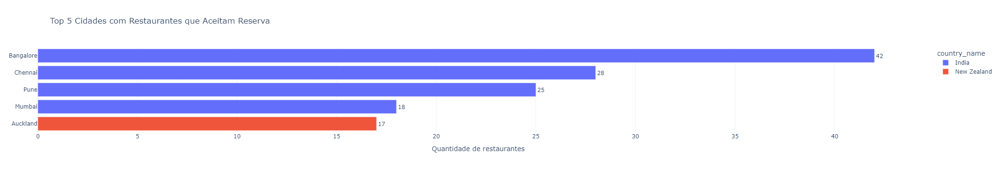

In [40]:
#Qual o nome da cidade que possui a maior quantidade de restaurantes que fazem reservas?

cidade_com_reserva = df1.groupby(["city","country_name"])["has_table_booking"].sum().sort_values(ascending = False).reset_index()


fig = px.bar(
    cidade_com_reserva.head(),
    x="has_table_booking",
    y="city",
    color="country_name",
    text="has_table_booking",
    title="Top 5 Cidades com Restaurantes que Aceitam Reserva",
    orientation="h"
)

fig.update_layout(
    yaxis={"categoryorder": "total ascending"},
    separators=",.",
    xaxis_title="Quantidade de restaurantes",
    yaxis_title=None,
    showlegend=True
)

fig.update_traces(
    texttemplate="%{text:,.0f}",
    textposition="outside"
)

fig.show()

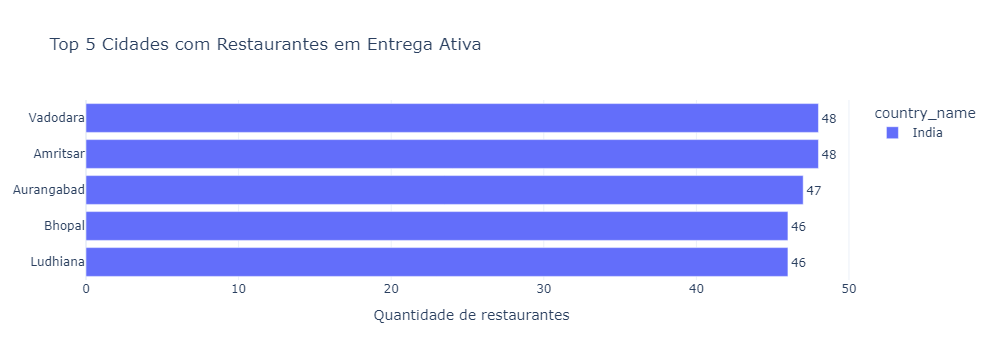

In [41]:
#Qual o nome da cidade que possui a maior quantidade de restaurantes que fazem entregas?

cidade_com_entregas= df1.groupby(["city","country_name"])["is_delivering_now"].sum().sort_values(ascending = False).reset_index()


fig = px.bar(
    cidade_com_entregas.head(),
    x="is_delivering_now",
    y="city",
    color="country_name",
    text="is_delivering_now",
    title="Top 5 Cidades com Restaurantes em Entrega Ativa",
    orientation="h"
)

fig.update_layout(
    yaxis={"categoryorder": "total ascending"},
    separators=",.",
    xaxis_title="Quantidade de restaurantes",
    yaxis_title=None,
    showlegend=True
)

fig.update_traces(
    texttemplate="%{text:,.0f}",
    textposition="outside"
)

fig.show()

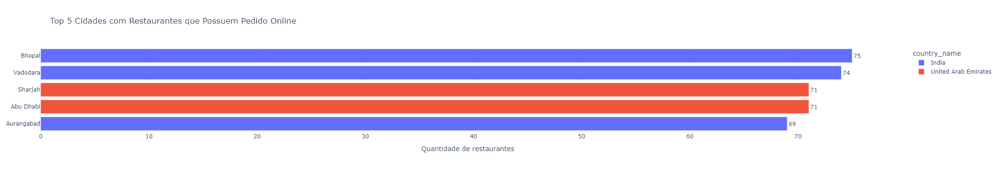

In [42]:
#Qual o nome da cidade que possui a maior quantidade de restaurantes que aceitam pedidos online?

cidade_pedido_online= df1.groupby(["city","country_name"])["has_online_delivery"].sum().sort_values(ascending = False).reset_index()

fig = px.bar(
    cidade_pedido_online.head(),
    x="has_online_delivery",
    y="city",
    color="country_name",
    text="has_online_delivery",
    title="Top 5 Cidades com Restaurantes que Possuem Pedido Online",
    orientation="h"
)

fig.update_layout(
    yaxis={"categoryorder": "total ascending"},
    separators=",.",
    xaxis_title="Quantidade de restaurantes",
    yaxis_title=None,
    showlegend=True
)

fig.update_traces(
    texttemplate="%{text:,.0f}",
    textposition="outside"
)

fig.show()

# Restaurantes

1. Qual o nome do restaurante que possui a maior quantidade de avaliações?
2. Qual o nome do restaurante com a maior nota média?
3. Qual o nome do restaurante que possui o maior valor de uma prato para duas
pessoas?
4. Qual o nome do restaurante de tipo de culinária brasileira que possui a menor
média de avaliação?
5. Qual o nome do restaurante de tipo de culinária brasileira, e que é do Brasil, que
possui a maior média de avaliação?
6. Os restaurantes que aceitam pedido online são também, na média, os
restaurantes que mais possuem avaliações registradas?
7. Os restaurantes que fazem reservas são também, na média, os restaurantes que
possuem o maior valor médio de um prato para duas pessoas?
8. Os restaurantes do tipo de culinária japonesa dos Estados Unidos da América
possuem um valor médio de prato para duas pessoas maior que as churrascarias
americanas (BBQ)?

In [43]:
df_culinaria["cuisines"] = df_culinaria["cuisines"].str.strip().str.casefold()

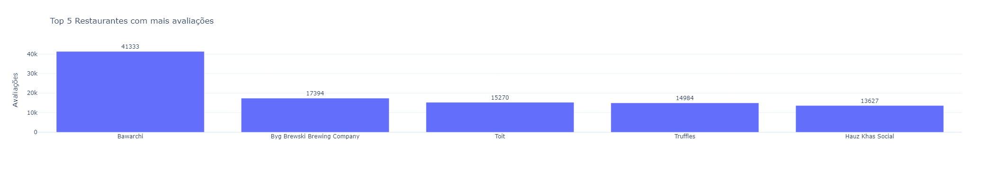

In [44]:
#Qual o nome do restaurante que possui a maior quantidade de avaliações?

restaurante_qtd_aval= df1[["restaurant_name","votes",]].sort_values(by = "votes", ascending = False)

fig = px.bar(
    restaurante_qtd_aval.head(),
    x="restaurant_name",
    y="votes",
    text="votes",
    title="Top 5 Restaurantes com mais avaliações",
)

fig.update_traces(
    textposition="outside",
    cliponaxis=False
)

fig.update_layout(
    separators=",.",
    showlegend=False,
    xaxis_title=None,
    yaxis_title="Avaliações"
)
fig.show()

In [78]:
# Qual o nome do restaurante com a maior nota média?
restaurante_maior_media = df1[["restaurant_name","aggregate_rating", "votes",]].sort_values(by = ["aggregate_rating","votes"], ascending = False)



,restaurant_name,aggregate_rating,votes
3038,Byg Brewski Brewing Company,4.9,17394
3018,AB's - Absolute Barbecues,4.9,12443
3369,AB's - Absolute Barbecues,4.9,9774
4362,Barbeque Nation,4.9,8271
2967,AB's - Absolute Barbecues,4.9,6877
...,...,...,...
3629,Blue Restaurant,0.0,0
5116,Madras Rasoi,0.0,0
5165,Kabab Corner,0.0,0
6748,Veeno,0.0,0


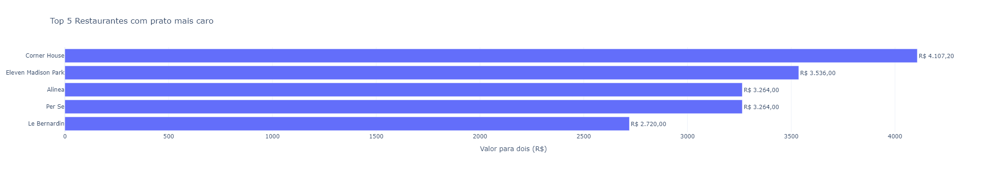

In [46]:
# Qual o nome do restaurante que possui o maior valor de uma prato para duas pessoas?

restaurante_maior_valor = df1.loc[:,["restaurant_name","average_cost_for_two_real"]].sort_values(by = "average_cost_for_two_real", ascending = False)

fig = px.bar(
    restaurante_maior_valor.head(5),
    x="average_cost_for_two_real",
    y="restaurant_name",
    text="average_cost_for_two_real",
    title="Top 5 Restaurantes com prato mais caro",
    orientation='h'
)

fig.update_layout(yaxis={'categoryorder':'total ascending'}, separators=",.", xaxis_title="Valor para dois (R$)", yaxis_title=None)
fig.update_traces(textposition="outside", texttemplate='R$ %{text:,.2f}')
fig.show()

In [47]:
# Qual o nome do restaurante de tipo de culinária brasileira que possui a menor média de avaliação?

restaurantes_brasileiros = df_culinaria.loc[df_culinaria["cuisines"] == "brazilian"]
restaurante_menor_media = restaurantes_brasileiros.groupby("restaurant_name")[["aggregate_rating","votes"]].mean().sort_values(by = ["aggregate_rating", "votes"], ascending=[True, False]).reset_index()

restaurante_menor_media.head()

,restaurant_name,aggregate_rating,votes
0,Amadeus,0.0,3.0
1,Galeteria Beira Lago,0.0,3.0
2,Loca Como tu Madre,0.0,3.0
3,Peixe na Rede,0.0,3.0
4,Quitéria,0.0,3.0


In [48]:
# Qual o nome do restaurante de tipo de culinária brasileira, e que é do Brasil, que possui a maior média de avaliação?

df_filtrado = df_culinaria.loc[(df_culinaria["cuisines"] == "brazilian") & (df_culinaria["country_name"] == "Brazil")]

restaurante_brasileiro_media = df_filtrado.groupby("restaurant_name")[["aggregate_rating", "votes"]].mean().sort_values(["aggregate_rating", "votes"], ascending = False).reset_index()

restaurante_brasileiro_media.head()

,restaurant_name,aggregate_rating,votes
0,Aprazível,4.9,63.0
1,Braseiro da Gávea,4.9,47.0
2,Mocotó,4.8,30.0
3,Fogo de Chão,4.8,26.0
4,D.O.M.,4.8,23.0


In [49]:
# Os restaurantes que aceitam pedido online são também, na média, os restaurantes que mais possuem avaliações registradas?
media_delivery = df1.groupby("has_online_delivery")["votes"].mean().sort_values(ascending = False).reset_index()
media_delivery["has_online_delivery"] = media_delivery["has_online_delivery"].replace({0: "Não", 1: "Sim"})
media_delivery["votes"] = media_delivery["votes"].map('{:,.2f}'.format)
media_delivery

,has_online_delivery,votes
0,Sim,838.82
1,Não,482.57


In [50]:
# Os restaurantes que fazem reservas são também, na média, os restaurantes que possuem o maior valor médio de um prato para duas pessoas?

media_reserva = df1.groupby("has_table_booking")["average_cost_for_two_real"].mean().sort_values(ascending = False).reset_index()
media_reserva["average_cost_for_two_real"] = media_reserva["average_cost_for_two_real"].map('{:,.2f}'.format)
media_reserva["has_table_booking"] = media_reserva["has_table_booking"].replace({ 0 : "Não", 1 : "Sim"})
media_reserva

,has_table_booking,average_cost_for_two_real
0,Sim,197.64
1,Não,159.48


In [51]:
# Os restaurantes do tipo de culinária japonesa dos Estados Unidos da América possuem um valor médio de prato para duas pessoas maior que as churrascarias americanas (BBQ)?

df_culinaria_eua = df_culinaria.loc[(df_culinaria["cuisines"] == "japanese") | (df_culinaria["cuisines"] == "bbq") & (df_culinaria["country_name"] == "United States of America")]
media_cuisines_eua = df_culinaria_eua.groupby("cuisines")["average_cost_for_two_real"].mean().sort_values(ascending = False).reset_index()
media_cuisines_eua

,cuisines,average_cost_for_two_real
0,japanese,268.725135
1,bbq,216.533333


# Tipos de Culinária

1. Dos restaurantes que possuem o tipo de culinária italiana, qual o nome do
restaurante com a maior média de avaliação?
2. Dos restaurantes que possuem o tipo de culinária italiana, qual o nome do
restaurante com a menor média de avaliação?
3. Dos restaurantes que possuem o tipo de culinária americana, qual o nome do
restaurante com a maior média de avaliação?
4. Dos restaurantes que possuem o tipo de culinária americana, qual o nome do
restaurante com a menor média de avaliação?
5. Dos restaurantes que possuem o tipo de culinária árabe, qual o nome do
restaurante com a maior média de avaliação?
6. Dos restaurantes que possuem o tipo de culinária árabe, qual o nome do
restaurante com a menor média de avaliação?
7. Dos restaurantes que possuem o tipo de culinária japonesa, qual o nome do
restaurante com a maior média de avaliação?
8. Dos restaurantes que possuem o tipo de culinária japonesa, qual o nome do
restaurante com a menor média de avaliação?
9. Dos restaurantes que possuem o tipo de culinária caseira, qual o nome do
restaurante com a maior média de avaliação?
10. Dos restaurantes que possuem o tipo de culinária caseira, qual o nome do
restaurante com a menor média de avaliação?
11. Qual o tipo de culinária que possui o maior valor médio de um prato para duas
pessoas?
12. Qual o tipo de culinária que possui a maior nota média?
13. Qual o tipo de culinária que possui mais restaurantes que aceitam pedidos
online e fazem entregas?


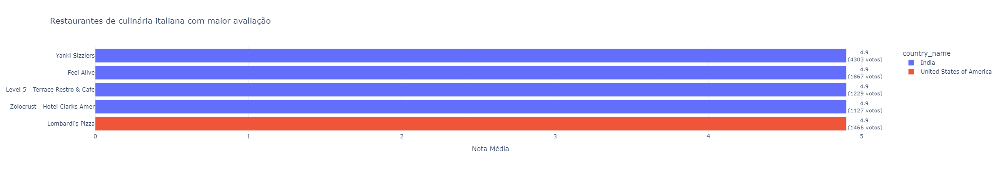

In [53]:
# Dos restaurantes que possuem o tipo de culinária italiana, qual o nome do restaurante com a maior média de avaliação?

restaurantes_italianos = df_culinaria[df_culinaria["cuisines"] == "italian"]
restaurante_media = restaurantes_italianos.groupby(["restaurant_name", "country_name"]).agg(aggregate_rating=("aggregate_rating", "mean"), votes=("votes", "sum")).sort_values(by=["aggregate_rating", "votes"], ascending=[False, False]).reset_index()

fig = px.bar(
    restaurante_media.head(5),
    x="aggregate_rating",
    y="restaurant_name",
    text="aggregate_rating",
    title="Restaurantes de culinária italiana com maior avaliação",
    orientation='h',
    custom_data=["votes"],
    color="country_name"
)

fig.update_layout(yaxis=dict(autorange = "reversed"), xaxis_title="Nota Média", yaxis_title=None)
fig.update_traces(textposition="outside", texttemplate='%{text:.1f} <br>(%{customdata[0]:.0f} votos)')
fig.show()

In [54]:
# Dos restaurantes que possuem o tipo de culinária italiana, qual o nome do restaurante com a menor média de avaliação?
restaurantes_italianos_2 = df_culinaria[df_culinaria["cuisines"] == "italian"]
restaurante_media_2 = restaurantes_italianos_2.groupby(["restaurant_name", "country_name"]).agg(aggregate_rating=("aggregate_rating", "mean"), votes=("votes", "sum")).sort_values(by=["aggregate_rating", "votes"], ascending=[True, False]).reset_index()

restaurante_media_2.head()

,restaurant_name,country_name,aggregate_rating,votes
0,Le Delicatezze Di Bruno,United Kingdom,0.0,3
1,Più,Brazil,0.0,3
2,Seasons Restaurant,India,0.0,3
3,Bene - Sheraton Rio Hotel,Brazil,0.0,2
4,La Bocca Bar e Trattoria,Brazil,0.0,1


american


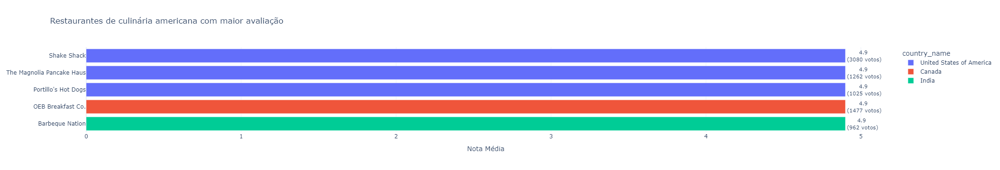

In [55]:
#Dos restaurantes que possuem o tipo de culinária americana, qual o nome do restaurante com a maior média de avaliação?

# Verificando as cozinhas que são americanas pela escrita
lista_americana = sorted(df_culinaria["cuisines"].unique())
for cozinha in lista_americana:
    if cozinha.startswith("amer"):
        print(cozinha)
        
# executando o código  

restaurante_americano = df_culinaria[df_culinaria["cuisines"] == "american"]
restaurante_media_americano = restaurante_americano.groupby(["restaurant_name", "country_name"]).agg(aggregate_rating=("aggregate_rating", "mean"), votes=("votes", "sum")).sort_values(by=["aggregate_rating", "votes"], ascending=[False, False]).reset_index()

fig = px.bar(
    restaurante_media_americano.head(5),
    x="aggregate_rating",
    y="restaurant_name",
    text="aggregate_rating",
    title="Restaurantes de culinária americana com maior avaliação",
    orientation='h',
    color="country_name",
    custom_data=["votes"]
)
fig.update_layout(yaxis=dict(autorange = "reversed"), xaxis_title="Nota Média", yaxis_title=None)
fig.update_traces(textposition="outside", texttemplate='%{text:.1f} <br>(%{customdata[0]:.0f} votos)')
fig.show()

In [56]:
#Dos restaurantes que possuem o tipo de culinária americana, qual o nome do restaurante com a menor média de avaliação?

restaurante_americano_2 = df_culinaria[df_culinaria["cuisines"] == "american"]
restaurante_media_americano_2 = restaurante_americano_2.groupby(["restaurant_name", "country_name"]).agg(aggregate_rating=("aggregate_rating", "mean"), votes=("votes", "sum")).sort_values(by=["aggregate_rating", "votes"], ascending=[True, False]).reset_index()

fig = px.bar(
    restaurante_media_americano_2.head(5),
    x="aggregate_rating",
    y="restaurant_name",
    text="aggregate_rating",
    title="Restaurantes de culinária americana com menor avaliação",
    orientation='h',
    color="country_name",
    custom_data=["votes"]
)
fig.update_layout(yaxis=dict(autorange = "reversed"), xaxis_title="Nota Média", yaxis_title=None)
fig.update_traces(textposition="outside", texttemplate='%{text:.1f} <br>(%{customdata[0]:.0f} votos)')
fig.show()

In [57]:
#Dos restaurantes que possuem o tipo de culinária árabe, qual o nome do restaurante com a maior média de avaliação?

# Verificando as cozinhas que são arabes pela escrita
lista_arabe = sorted(df_culinaria["cuisines"].unique())
for cozinha in lista_arabe:
    if cozinha.startswith("arab"):
        print(cozinha)
#executando       
restaurante_arabe = df_culinaria[df_culinaria["cuisines"] == "arabian"]
restaurante_media_arabe = restaurante_arabe.groupby(["restaurant_name", "country_name"]).agg(aggregate_rating=("aggregate_rating", "mean"), votes=("votes", "sum")).sort_values(by=["aggregate_rating", "votes"], ascending=[False, False]).reset_index()

fig = px.bar(
    restaurante_media_arabe.head(5),
    x="aggregate_rating",
    y="restaurant_name",
    text="aggregate_rating",
    title="Top 5 Restaurantes (Árabe) com MAIOR avaliação",
    orientation='h',
    color="country_name",
    custom_data=["votes"]
)
fig.update_layout(yaxis=dict(autorange = "reversed"), xaxis_title="Nota Média", yaxis_title=None)
fig.update_traces(textposition="outside", texttemplate='%{text:.1f} <br>(%{customdata[0]:.0f} votos)')
fig.show()

arabian


In [58]:
#Dos restaurantes que possuem o tipo de culinária árabe, qual o nome do restaurante com a menor média de avaliação?
 
restaurante_arabe_2 = df_culinaria[df_culinaria["cuisines"] == "arabian"]
restaurante_media_arabe_2 = restaurante_arabe_2.groupby(["restaurant_name", "country_name"]).agg(aggregate_rating = ("aggregate_rating", "mean"), votes = ("votes", "sum")).sort_values(by=["aggregate_rating", "votes"], ascending= [True, False]).reset_index()

fig = px.bar(
    restaurante_media_arabe_2.head(5),
    x="aggregate_rating",
    y="restaurant_name",
    text="aggregate_rating",
    title="Restaurantes de culinária árabe com menor avaliação",
    orientation='h',
    color="country_name",
    custom_data=["votes"]
)
fig.update_layout(yaxis=dict(autorange="reversed"), xaxis_title="Nota Média", yaxis_title=None)
fig.update_traces(textposition="outside", texttemplate='%{text:.1f} <br>(%{customdata[0]:.0f} votos)')
fig.show()

In [59]:
# Dos restaurantes que possuem o tipo de culinária japonesa, qual o nome do restaurante com a maior média de avaliação?

# Verificando as cozinhas que são japonesas pela escrita
lista_japonesa = sorted(df_culinaria["cuisines"].unique())
for cozinha in lista_japonesa:
    if cozinha.startswith("jap"):
        print(cozinha)
        
# executando o código  

restaurante_japones = df_culinaria[df_culinaria["cuisines"] == "japanese"]
restaurante_media_japones = restaurante_japones.groupby(["restaurant_name", "country_name"]).agg(aggregate_rating=("aggregate_rating", "mean"), votes=("votes", "sum")).sort_values(by=["aggregate_rating", "votes"], ascending=[False, False]).reset_index()

fig = px.bar(
    restaurante_media_japones.head(5),
    x="aggregate_rating",
    y="restaurant_name",
    text="aggregate_rating",
    title="Restaurantes de culinária japonesa com maior avaliação",
    orientation='h',
    color="country_name",
    custom_data=["votes"]
)
fig.update_layout(yaxis=dict(autorange="reversed"), xaxis_title="Nota Média", yaxis_title=None)
fig.update_traces(textposition="outside", texttemplate='%{text:.1f} <br>(%{customdata[0]:.0f} votos)')
fig.show()

japanese


In [60]:
# Dos restaurantes que possuem o tipo de culinária japonesa, qual o nome do restaurante com a menor média de avaliação?

restaurante_japones_2 = df_culinaria[df_culinaria["cuisines"] == "japanese"]
restaurante_media_japones_2 = restaurante_japones_2.groupby(["restaurant_name", "country_name"]).agg(aggregate_rating=("aggregate_rating", "mean"), votes=("votes", "sum")).sort_values(by=["aggregate_rating", "votes"], ascending=[True, False]).reset_index()

fig = px.bar(
    restaurante_media_japones_2.head(5),
    x="aggregate_rating",
    y="restaurant_name",
    text="aggregate_rating",
    title="Restaurantes de culinária japonesa com menor avaliação",
    orientation='h',
    color="country_name",
    custom_data=["votes"]
)
fig.update_layout(yaxis={'categoryorder':'total descending'}, xaxis_title="Nota Média", yaxis_title=None)
fig.update_traces(textposition="outside", texttemplate='%{text:.1f} <br>(%{customdata[0]:.0f} votos)')
fig.show()


In [61]:
# Dos restaurantes que possuem o tipo de culinária caseira, qual o nome do restaurante com a maior média de avaliação?

restaurante_caseira = df_culinaria[df_culinaria["cuisines"] == "home-made"]
restaurante_media_caseira = restaurante_caseira.groupby(["restaurant_name", "country_name"]).agg(aggregate_rating=("aggregate_rating", "mean"), votes=("votes", "sum")).sort_values(by=["aggregate_rating", "votes"], ascending=[False, False]).reset_index()

fig = px.bar(
    restaurante_media_caseira.head(5),
    x="aggregate_rating",
    y="restaurant_name",
    text="aggregate_rating",
    title="Restaurantes de culinária caseira com maior avaliação",
    orientation='h',
    color="country_name",
    custom_data=["votes"]
)
fig.update_layout(yaxis={'categoryorder':'total ascending'}, xaxis_title="Nota Média", yaxis_title=None)
fig.update_traces(textposition="outside", texttemplate='%{text:.1f} <br>(%{customdata[0]:.0f} votos)')
fig.show()


In [62]:
# Dos restaurantes que possuem o tipo de culinária caseira, qual o nome do restaurante com a menor média de avaliação?

restaurante_caseira_2 = df_culinaria[df_culinaria["cuisines"] == "home-made"]
restaurante_media_caseira_2 = restaurante_caseira_2.groupby(["restaurant_name", "country_name"]).agg(aggregate_rating=("aggregate_rating", "mean"), votes=("votes", "sum")).sort_values(by=["aggregate_rating", "votes"], ascending=[True, False]).reset_index()

fig = px.bar(
    restaurante_media_caseira_2.head(5),
    x="aggregate_rating",
    y="restaurant_name",
    text="aggregate_rating",
    title="Restaurantes de culinária caseira com menor avaliação",
    orientation='h',
    color="country_name",
    custom_data=["votes"]
)
fig.update_layout(yaxis={'categoryorder':'total descending'}, xaxis_title="Nota Média", yaxis_title=None)
fig.update_traces(textposition="outside", texttemplate='%{text:.1f} <br>(%{customdata[0]:.0f} votos)')
fig.show()  

In [63]:
# Qual o tipo de culinária que possui o maior valor médio de um prato para duas pessoas?


culinaria_valor_medio = df_culinaria.groupby(["cuisines","restaurant_name"])["average_cost_for_two_real"].mean().sort_values(ascending=False).reset_index()

fig = px.bar(
    culinaria_valor_medio.head(5),
    x="average_cost_for_two_real",
    y="cuisines",
    text="average_cost_for_two_real",
    title="Culinárias com maior valor médio",
    orientation='h',
    custom_data=["restaurant_name"]
)
fig.update_layout(yaxis= None, separators=",.", xaxis_title="Valor (R$)", yaxis_title=None)
fig.update_traces(textposition="outside", texttemplate='R$ %{text:,.2f} <br>(%{customdata[0]})')
fig.show()

In [64]:
## Qual o tipo de culinária que possui a maior nota média?
culinaria_nota_media = df_culinaria.groupby("cuisines").agg(aggregate_rating = ("aggregate_rating", "mean"), votes = ("votes", "sum")).sort_values( by = ["aggregate_rating", "votes"], ascending = [False, False]).reset_index()
fig = px.bar(
    culinaria_nota_media.head(5),
    x="aggregate_rating",
    y="cuisines",
    text="aggregate_rating",
    title="Culinárias com maior maior nota média",
    orientation='h',
    custom_data=["votes"]
)
fig.update_layout(yaxis=dict(autorange = "reversed"), xaxis_title="Nota Média", yaxis_title=None)
fig.update_traces(textposition="outside", texttemplate='%{text:.2f} <br>(%{customdata[0]:.0f} votos)')
fig.show()

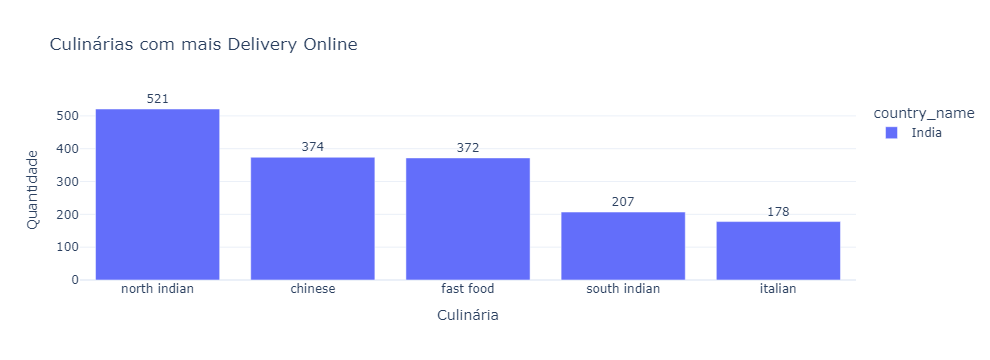

In [65]:
# Qual o tipo de culinária que possui mais restaurantes que aceitam pedidos online e fazem entregas?

culinaria_delivery_online = df_culinaria.loc[(df_culinaria["has_online_delivery"] == 1) & (df_culinaria["is_delivering_now"] == 1)]
avaliacao = culinaria_delivery_online.groupby(["cuisines", "country_name"])["restaurant_id"].count().sort_values(ascending=False).reset_index()

fig = px.bar(
    avaliacao.head(5),
    x="cuisines",
    y="restaurant_id",
    text="restaurant_id",
    title="Culinárias com mais Delivery Online",
    color="country_name"
)
fig.update_layout(xaxis_title="Culinária", yaxis_title="Quantidade")
fig.update_traces(textposition="outside", cliponaxis=False)
fig.show()